# 🧠 Brain Tumor Extraction from MRI Images
## Complete Project — Phase I & Phase II
**Made By:**  
- Nour Ezz &nbsp;&nbsp;|&nbsp;&nbsp; ID: 320230072  

---
> **Phase I:** Pre-processing pipeline (spatial + frequency domain enhancement)  
> **Phase II:** Feature extraction (CNN + handcrafted), Feature fusion, PCA reduction, Classification & Evaluation


---
# 📌 PHASE I — Pre-processing Pipeline


## Cell 1 — Imports & Dataset Loading
Load all libraries and read one sample image per class from the Training set.


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import warnings
warnings.filterwarnings('ignore')

DATASET_PATH = r"C:\Users\ahmed\E-JUST\College\Semester 6\Image Processing\Brain Tumor Extraction\Dataset\Training"

classes = sorted(os.listdir(DATASET_PATH))
print("Classes found:", classes)

sample_images = {}
for cls in classes:
    cls_path = os.path.join(DATASET_PATH, cls)
    img_name = os.listdir(cls_path)[0]
    img = cv2.imread(os.path.join(cls_path, img_name), cv2.IMREAD_GRAYSCALE)
    sample_images[cls] = cv2.resize(img, (224, 224))

print("✅ Sample images loaded. Shape:", list(sample_images.values())[0].shape)


Classes found: ['glioma', 'meningioma', 'notumor', 'pituitary']
✅ Sample images loaded. Shape: (224, 224)


## Cell 2 — Visualize Raw MRI Samples

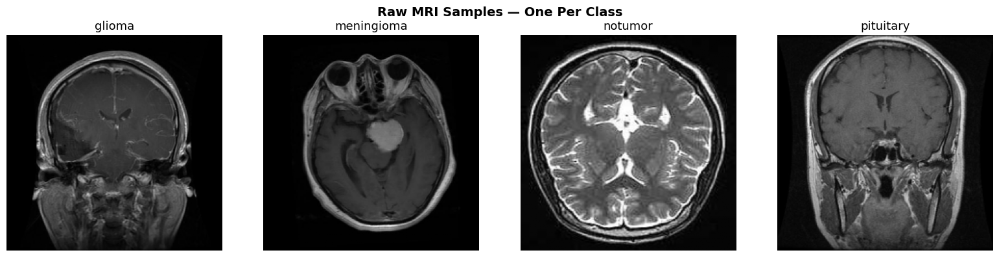

In [2]:
fig, axes = plt.subplots(1, len(classes), figsize=(16, 4))
for ax, cls in zip(axes, classes):
    ax.imshow(sample_images[cls], cmap='gray')
    ax.set_title(cls, fontsize=13)
    ax.axis('off')
plt.suptitle("Raw MRI Samples — One Per Class", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


## Cell 3 — Manual Histogram Equalization ⭐ (No built-in functions)

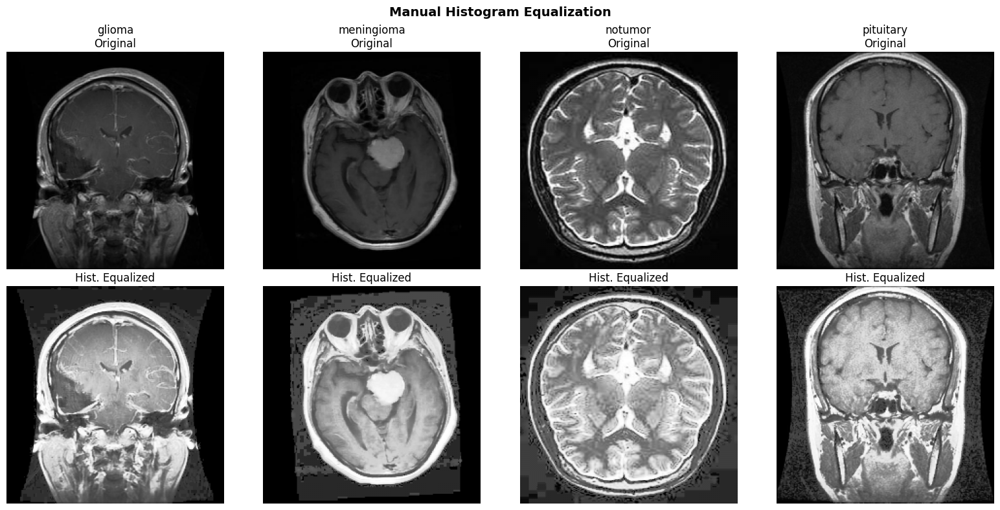

In [3]:
def histogram_equalization_manual(img):
    hist = np.zeros(256, dtype=np.float64)
    for pixel_val in img.flatten():
        hist[int(pixel_val)] += 1
    cdf = hist.cumsum()
    cdf_min = cdf[cdf > 0].min()
    N = img.size
    eq_map = np.round((cdf - cdf_min) / (N - cdf_min) * 255).astype(np.uint8)
    return eq_map[img.astype(np.uint8)]

fig, axes = plt.subplots(2, len(classes), figsize=(16, 8))
for i, cls in enumerate(classes):
    img = sample_images[cls]
    eq_img = histogram_equalization_manual(img)
    axes[0, i].imshow(img, cmap='gray'); axes[0, i].set_title(f"{cls}\nOriginal"); axes[0, i].axis('off')
    axes[1, i].imshow(eq_img, cmap='gray'); axes[1, i].set_title("Hist. Equalized"); axes[1, i].axis('off')
plt.suptitle("Manual Histogram Equalization", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 4 — Histogram Analysis (Before vs After)

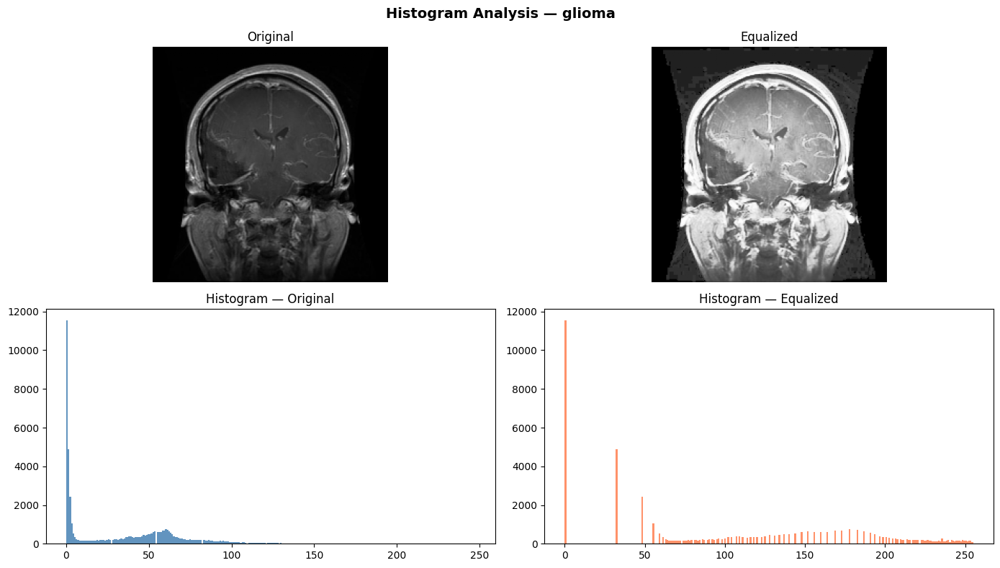

In [4]:
cls = classes[0]; img = sample_images[cls]; eq_img = histogram_equalization_manual(img)
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes[0,0].imshow(img, cmap='gray'); axes[0,0].set_title("Original"); axes[0,0].axis('off')
axes[0,1].imshow(eq_img, cmap='gray'); axes[0,1].set_title("Equalized"); axes[0,1].axis('off')
axes[1,0].hist(img.flatten(), bins=256, color='steelblue', alpha=0.85); axes[1,0].set_title("Histogram — Original")
axes[1,1].hist(eq_img.flatten(), bins=256, color='coral', alpha=0.85); axes[1,1].set_title("Histogram — Equalized")
plt.suptitle(f"Histogram Analysis — {cls}", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 5 — Contrast Stretching

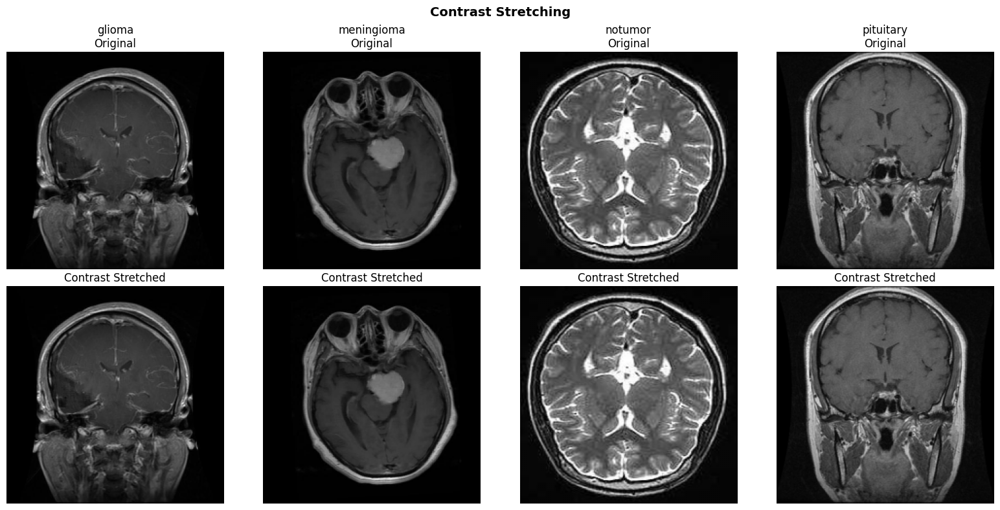

In [5]:
def contrast_stretching(img):
    img_min, img_max = img.min(), img.max()
    return ((img.astype(np.float64) - img_min) / (img_max - img_min) * 255).astype(np.uint8)

fig, axes = plt.subplots(2, len(classes), figsize=(16, 8))
for i, cls in enumerate(classes):
    img = sample_images[cls]
    axes[0,i].imshow(img, cmap='gray'); axes[0,i].set_title(f"{cls}\nOriginal"); axes[0,i].axis('off')
    axes[1,i].imshow(contrast_stretching(img), cmap='gray'); axes[1,i].set_title("Contrast Stretched"); axes[1,i].axis('off')
plt.suptitle("Contrast Stretching", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 6 — Noise Removal (Gaussian & Median)

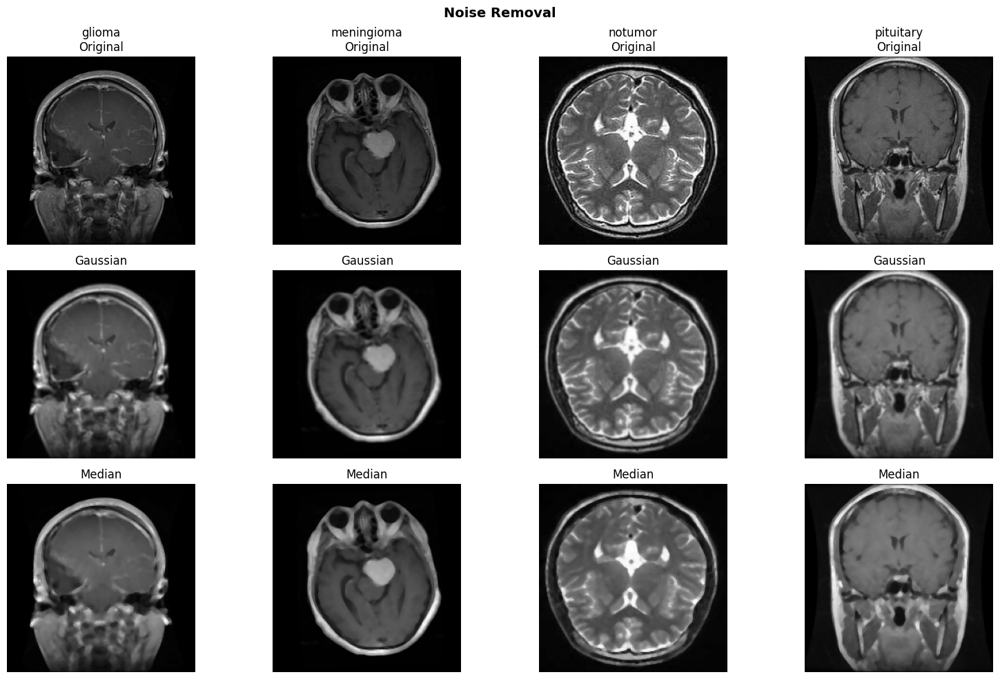

In [6]:
fig, axes = plt.subplots(3, len(classes), figsize=(16, 10))
for i, cls in enumerate(classes):
    img = sample_images[cls]
    axes[0,i].imshow(img, cmap='gray'); axes[0,i].set_title(f"{cls}\nOriginal"); axes[0,i].axis('off')
    axes[1,i].imshow(cv2.GaussianBlur(img,(5,5),0), cmap='gray'); axes[1,i].set_title("Gaussian"); axes[1,i].axis('off')
    axes[2,i].imshow(cv2.medianBlur(img,5), cmap='gray'); axes[2,i].set_title("Median"); axes[2,i].axis('off')
plt.suptitle("Noise Removal", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 7 — FFT Low-pass Filter ⭐ (Frequency Domain)

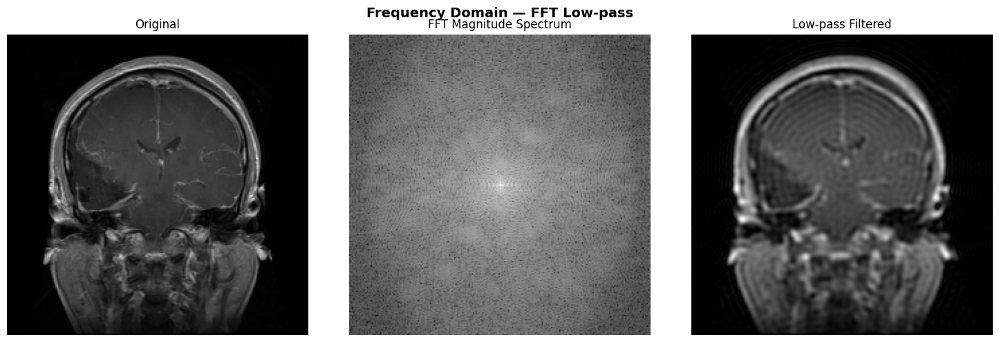

In [7]:
def apply_fft_lowpass(img, cutoff=40):
    f = np.fft.fft2(img); fshift = np.fft.fftshift(f)
    magnitude = np.log(np.abs(fshift) + 1)
    rows, cols = img.shape; crow, ccol = rows//2, cols//2
    mask = np.zeros((rows, cols), np.uint8)
    cv2.circle(mask, (ccol, crow), cutoff, 1, -1)
    f_inv = np.fft.ifftshift(fshift * mask)
    return magnitude, np.abs(np.fft.ifft2(f_inv)).astype(np.uint8)

cls = classes[0]; img = sample_images[cls]
magnitude, filtered = apply_fft_lowpass(img)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img, cmap='gray'); axes[0].set_title("Original"); axes[0].axis('off')
axes[1].imshow(magnitude, cmap='gray'); axes[1].set_title("FFT Magnitude Spectrum"); axes[1].axis('off')
axes[2].imshow(filtered, cmap='gray'); axes[2].set_title("Low-pass Filtered"); axes[2].axis('off')
plt.suptitle("Frequency Domain — FFT Low-pass", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 9 — CLAHE: Adaptive Local Contrast Enhancement ⭐ (No built-in)

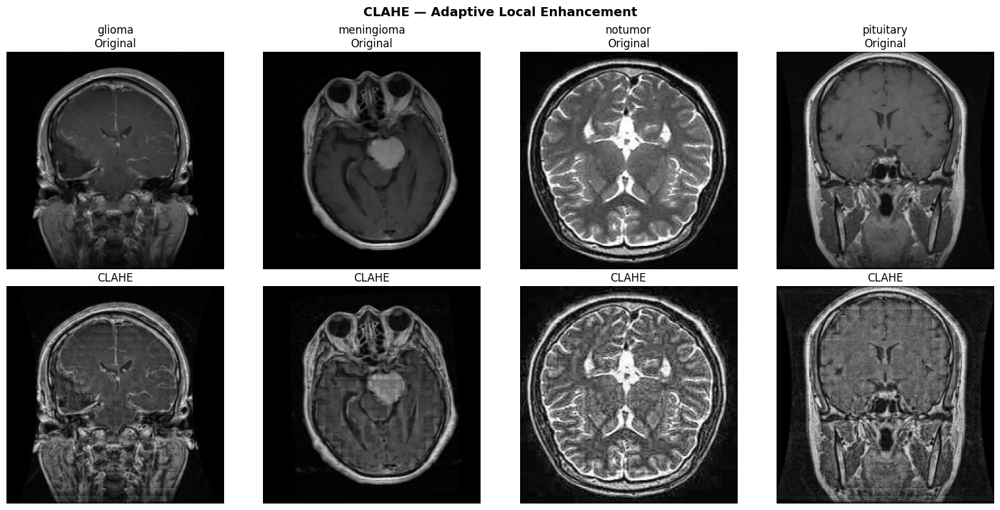

In [8]:
def apply_clahe(img, clip_limit=2.0, tile_size=(8,8)):
    rows, cols = img.shape
    th, tw = tile_size
    ny, nx = rows//th, cols//tw
    img_c = img[:ny*th, :nx*tw]
    result = np.zeros_like(img_c)
    for i in range(ny):
        for j in range(nx):
            tile = img_c[i*th:(i+1)*th, j*tw:(j+1)*tw]
            hist = np.zeros(256)
            for px in tile.flatten(): hist[int(px)] += 1
            clip = clip_limit * (tile.size / 256)
            excess = np.sum(np.maximum(hist - clip, 0))
            hist = np.minimum(hist, clip); hist += excess / 256
            cdf = hist.cumsum(); cdf_min = cdf[cdf>0].min()
            eq_map = np.round((cdf - cdf_min)/(tile.size - cdf_min)*255).astype(np.uint8)
            result[i*th:(i+1)*th, j*tw:(j+1)*tw] = eq_map[tile.astype(np.uint8)]
    return result

fig, axes = plt.subplots(2, len(classes), figsize=(16, 8))
for i, cls in enumerate(classes):
    img = sample_images[cls]
    axes[0,i].imshow(img, cmap='gray'); axes[0,i].set_title(f"{cls}\nOriginal"); axes[0,i].axis('off')
    axes[1,i].imshow(apply_clahe(img), cmap='gray'); axes[1,i].set_title("CLAHE"); axes[1,i].axis('off')
plt.suptitle("CLAHE — Adaptive Local Enhancement", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 10 — Morphological Operations

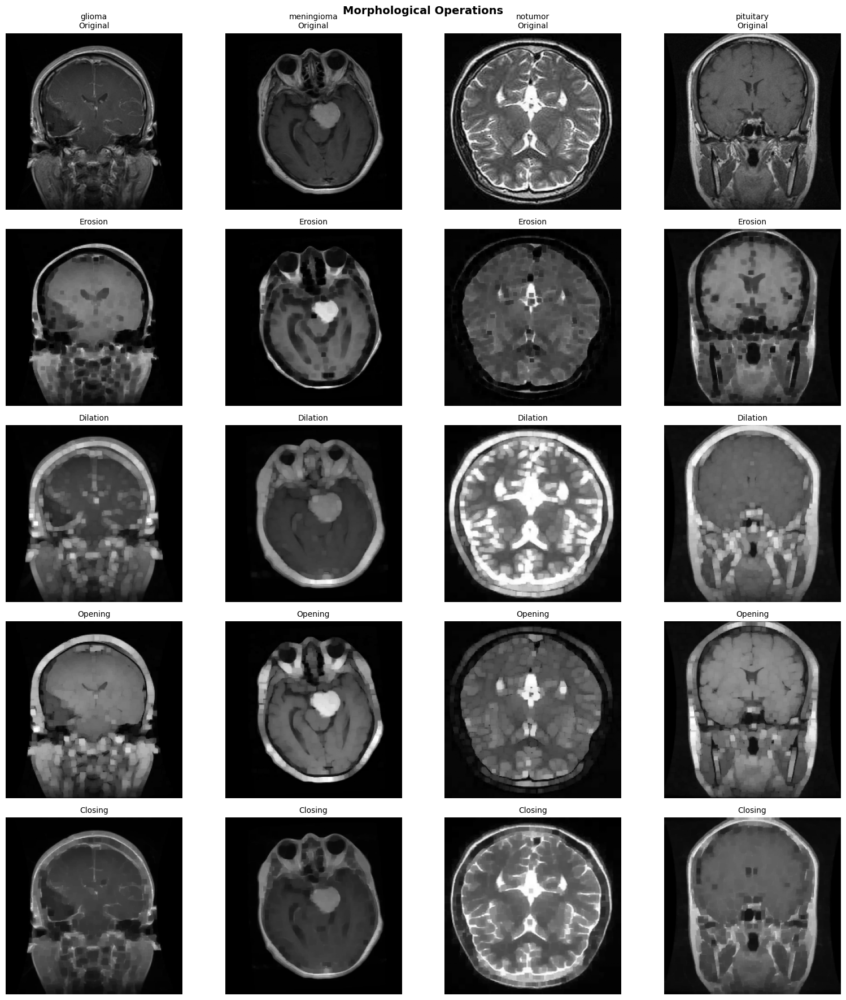

In [9]:
kernel = np.ones((5,5), np.uint8)
ops = {"Original": lambda img: img, "Erosion": lambda img: cv2.erode(img,kernel), 
       "Dilation": lambda img: cv2.dilate(img,kernel),
       "Opening": lambda img: cv2.morphologyEx(img,cv2.MORPH_OPEN,kernel),
       "Closing": lambda img: cv2.morphologyEx(img,cv2.MORPH_CLOSE,kernel)}
fig, axes = plt.subplots(len(ops), len(classes), figsize=(16, 18))
for row, (op_name, op_func) in enumerate(ops.items()):
    for col, cls in enumerate(classes):
        axes[row,col].imshow(op_func(sample_images[cls]), cmap='gray')
        axes[row,col].set_title(f"{cls}\n{op_name}" if row==0 else op_name, fontsize=10)
        axes[row,col].axis('off')
plt.suptitle("Morphological Operations", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 11 — Edge Detection (Sobel, Canny, Laplacian)

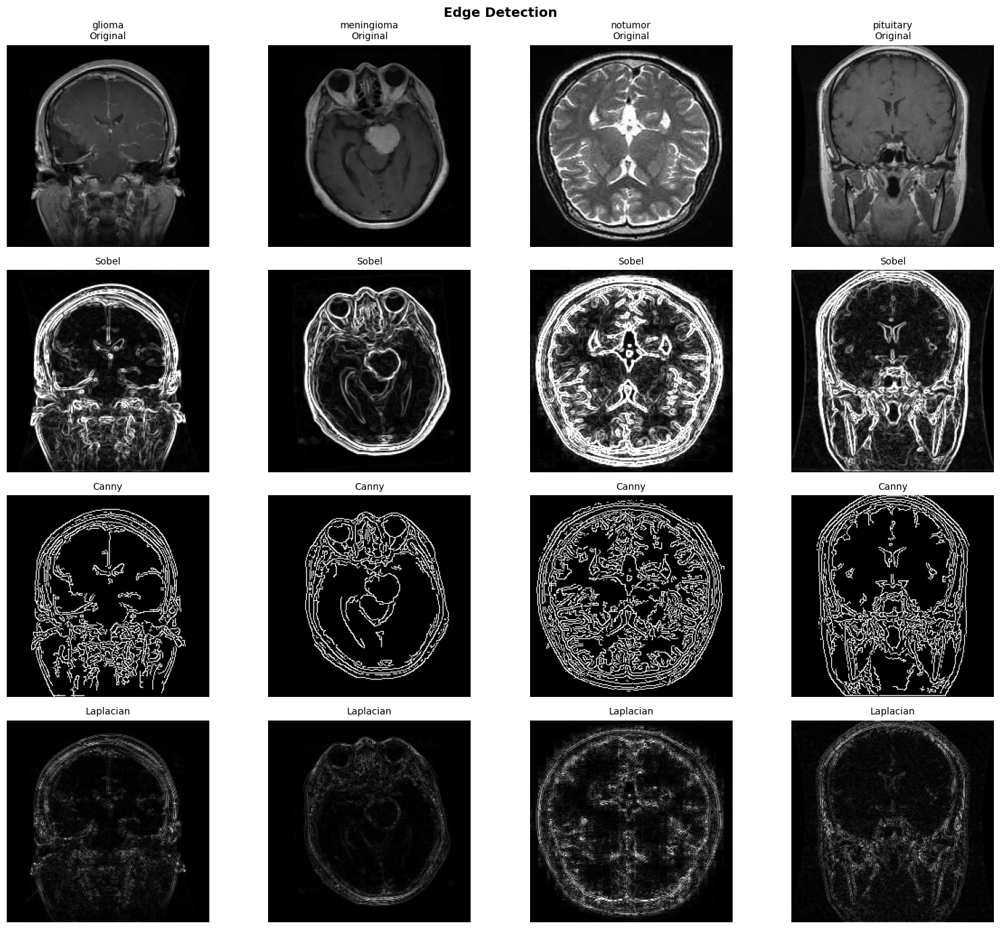

In [10]:
fig, axes = plt.subplots(4, len(classes), figsize=(16, 14))
for col, cls in enumerate(classes):
    img = sample_images[cls]
    sx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=3); sy = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=3)
    sobel = np.uint8(np.clip(np.sqrt(sx**2+sy**2),0,255))
    canny = cv2.Canny(img,50,150)
    laplacian = cv2.convertScaleAbs(cv2.Laplacian(img,cv2.CV_64F))
    for row, (res, title) in enumerate(zip([img,sobel,canny,laplacian],["Original","Sobel","Canny","Laplacian"])):
        axes[row,col].imshow(res, cmap='gray')
        axes[row,col].set_title(f"{cls}\n{title}" if row==0 else title, fontsize=10)
        axes[row,col].axis('off')
plt.suptitle("Edge Detection", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 12 — FFT High-pass Filter

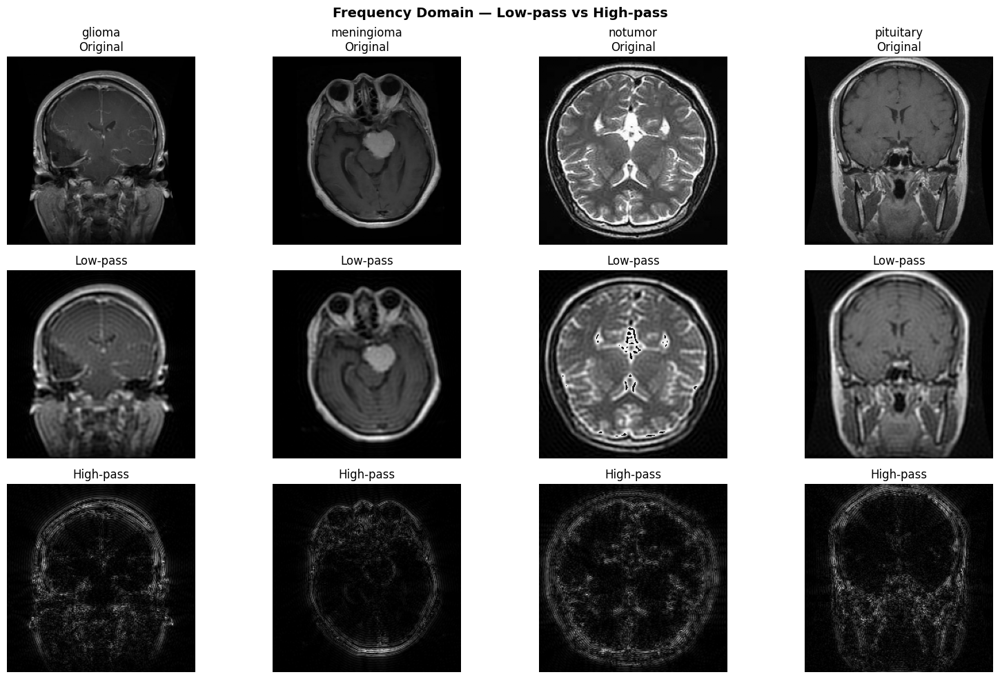

In [11]:
def apply_fft_highpass(img, cutoff=40):
    f = np.fft.fft2(img); fshift = np.fft.fftshift(f)
    rows, cols = img.shape; crow, ccol = rows//2, cols//2
    mask = np.ones((rows,cols), np.uint8)
    cv2.circle(mask,(ccol,crow),cutoff,0,-1)
    f_inv = np.fft.ifftshift(fshift*mask)
    return np.abs(np.fft.ifft2(f_inv)).astype(np.uint8)

fig, axes = plt.subplots(3, len(classes), figsize=(16,10))
for col, cls in enumerate(classes):
    img = sample_images[cls]
    _, low = apply_fft_lowpass(img); high = apply_fft_highpass(img)
    axes[0,col].imshow(img,cmap='gray'); axes[0,col].set_title(f"{cls}\nOriginal"); axes[0,col].axis('off')
    axes[1,col].imshow(low,cmap='gray'); axes[1,col].set_title("Low-pass"); axes[1,col].axis('off')
    axes[2,col].imshow(high,cmap='gray'); axes[2,col].set_title("High-pass"); axes[2,col].axis('off')
plt.suptitle("Frequency Domain — Low-pass vs High-pass", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 13 — Image Sharpening (Unsharp Masking)

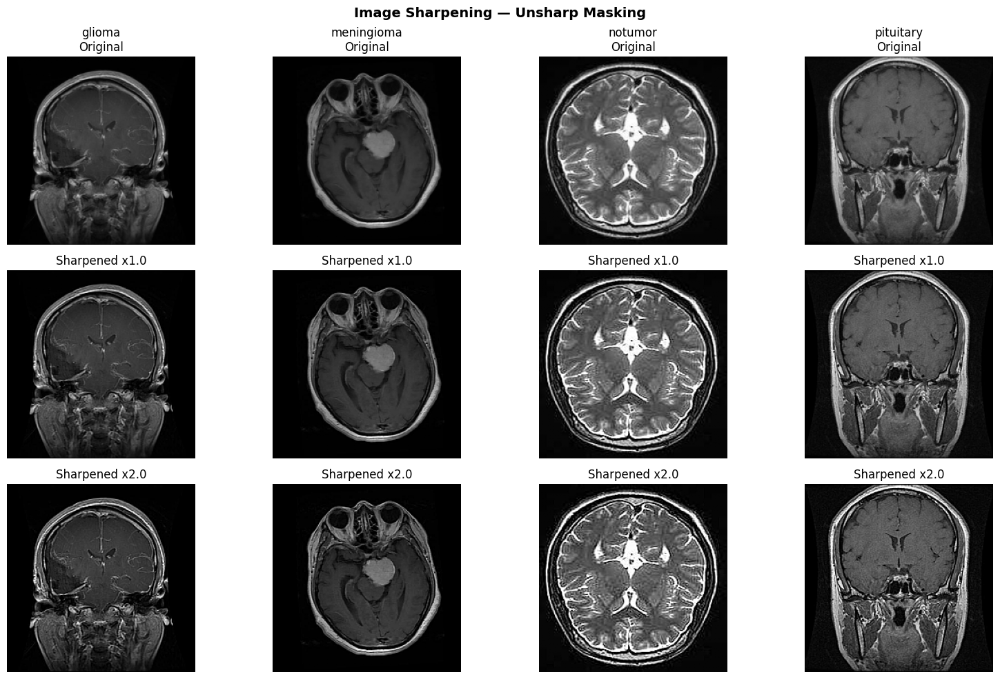

In [12]:
def sharpen_image(img, strength=1.5):
    blurred = cv2.GaussianBlur(img,(5,5),0)
    detail = img.astype(np.float64) - blurred.astype(np.float64)
    return np.clip(img.astype(np.float64) + strength*detail, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(3, len(classes), figsize=(16,10))
for col, cls in enumerate(classes):
    img = sample_images[cls]
    axes[0,col].imshow(img,cmap='gray'); axes[0,col].set_title(f"{cls}\nOriginal"); axes[0,col].axis('off')
    axes[1,col].imshow(sharpen_image(img,1.0),cmap='gray'); axes[1,col].set_title("Sharpened x1.0"); axes[1,col].axis('off')
    axes[2,col].imshow(sharpen_image(img,2.0),cmap='gray'); axes[2,col].set_title("Sharpened x2.0"); axes[2,col].axis('off')
plt.suptitle("Image Sharpening — Unsharp Masking", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 14 — Complete Phase I Pipeline Summary

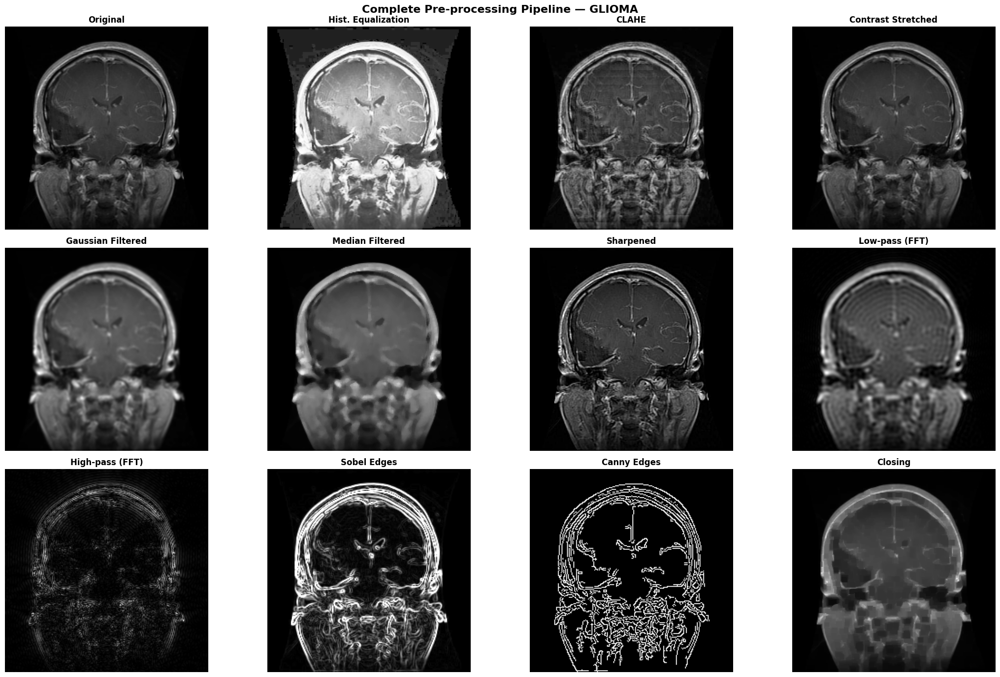

✅ Phase I Complete!


In [13]:
cls = classes[0]; img = sample_images[cls]
_, low_img = apply_fft_lowpass(img); high_img = apply_fft_highpass(img)
sx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=3); sy = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=3)
pipeline = {
    "Original": img, "Hist. Equalization": histogram_equalization_manual(img),
    "CLAHE": apply_clahe(img), "Contrast Stretched": contrast_stretching(img),
    "Gaussian Filtered": cv2.GaussianBlur(img,(5,5),0), "Median Filtered": cv2.medianBlur(img,5),
    "Sharpened": sharpen_image(img,1.5), "Low-pass (FFT)": low_img,
    "High-pass (FFT)": high_img, "Sobel Edges": np.uint8(np.clip(np.sqrt(sx**2+sy**2),0,255)),
    "Canny Edges": cv2.Canny(img,50,150),
    "Closing": cv2.morphologyEx(img,cv2.MORPH_CLOSE,np.ones((5,5),np.uint8))
}
fig, axes = plt.subplots(3, 4, figsize=(22, 14)); axes = axes.flatten()
for ax, (title, image) in zip(axes, pipeline.items()):
    ax.imshow(image, cmap='gray'); ax.set_title(title, fontsize=12, fontweight='bold'); ax.axis('off')
plt.suptitle(f"Complete Pre-processing Pipeline — {cls.upper()}", fontsize=16, fontweight='bold')
plt.tight_layout(); plt.show()
print("✅ Phase I Complete!")


---
# 📌 PHASE II — Feature Extraction, Fusion, Reduction & Classification


## Cell 15 — Install & Import Phase II Libraries

In [14]:
!pip install tensorflow scikit-learn scikit-image matplotlib seaborn -q

import tensorflow as tf
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, EfficientNetB0
from tensorflow.keras.preprocessing import image as keras_image
from tensorflow.keras.models import Model
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, classification_report,
                              confusion_matrix, roc_auc_score, cohen_kappa_score,
                              ConfusionMatrixDisplay)
from skimage.feature import graycomatrix, graycoprops
import seaborn as sns
print("✅ All Phase II libraries loaded.")
print("TensorFlow version:", tf.__version__)


✅ All Phase II libraries loaded.
TensorFlow version: 2.20.0


## Cell 16 — Load Full Dataset
Load all images from all classes, resize to 224×224, and build feature-ready arrays.


In [15]:
IMG_SIZE = 224
X_raw = []   # grayscale images for handcrafted features
X_rgb = []   # RGB images for CNN models
y = []       # labels

print("Loading dataset...")
for cls in classes:
    cls_path = os.path.join(DATASET_PATH, cls)
    imgs = os.listdir(cls_path)
    for img_name in imgs:
        img_path = os.path.join(cls_path, img_name)
        # Grayscale for handcrafted
        img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img_gray is None: continue
        img_gray = cv2.resize(img_gray, (IMG_SIZE, IMG_SIZE))
        X_raw.append(img_gray)
        # RGB for CNN (replicate grayscale to 3 channels)
        img_rgb = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2RGB)
        X_rgb.append(img_rgb)
        y.append(cls)

X_raw = np.array(X_raw)
X_rgb = np.array(X_rgb)
y = np.array(y)

# Encode labels
le = LabelEncoder()
y_enc = le.fit_transform(y)

print(f"✅ Dataset loaded: {len(X_raw)} images, {len(classes)} classes")
print("Class distribution:")
for cls in classes:
    print(f"  {cls}: {np.sum(y == cls)}")


Loading dataset...
✅ Dataset loaded: 5600 images, 4 classes
Class distribution:
  glioma: 1400
  meningioma: 1400
  notumor: 1400
  pituitary: 1400


## Cell 17 — Preprocess All Images (Apply Phase I Pipeline)
Apply the best preprocessing from Phase I to the full dataset before feature extraction.


In [ ]:
def preprocess_image(img):
    """Apply full Phase I pipeline to a single image."""
    # 1. CLAHE enhancement to improve local contrast
    img = apply_clahe(img)
    # 2. Median noise removal to preserve edges while reducing noise
    img = cv2.medianBlur(img, 5)
    # 3. Sharpening to enhance details
    img = sharpen_image(img, strength=1.5)
    return img

print("Applying preprocessing pipeline to all images...")
X_preprocessed = np.array([preprocess_image(img) for img in X_raw])
# Convert to RGB for CNN
X_preprocessed_rgb = np.array([cv2.cvtColor(img, cv2.COLOR_GRAY2RGB) for img in X_preprocessed])
print(f"✅ Preprocessing complete. Shape: {X_preprocessed_rgb.shape}")


Applying preprocessing pipeline to all images...
✅ Preprocessing complete. Shape: (5600, 224, 224, 3)


## Cell 18 — CNN Feature Extraction (VGG16, VGG19, ResNet50, EfficientNet)
Use pre-trained CNN models as feature extractors (transfer learning).  
We remove the final classification layer and extract the deep feature vector from each model.


In [ ]:
def build_feature_extractor(model_name):
    """Build CNN feature extractor from pre-trained model."""
    input_shape = (224, 224, 3)
    if model_name == 'VGG16':
        base = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    elif model_name == 'VGG19':
        base = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)
    elif model_name == 'ResNet50': #50 layers with skip connections — solves vanishing gradient
        base = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    elif model_name == 'EfficientNetB0': #Smartly scales depth+width+resolution together
        base = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)
    # Global Average Pooling to flatten
    x = tf.keras.layers.GlobalAveragePooling2D()(base.output)
    return Model(inputs=base.input, outputs=x)

def extract_cnn_features(model_name, X_imgs):
    """Extract features from all images using specified CNN."""
    print(f"  Extracting {model_name} features...")
    extractor = build_feature_extractor(model_name)
    # Normalize to [0,1]
    X_norm = X_imgs.astype(np.float32) / 255.0
    features = extractor.predict(X_norm, batch_size=32, verbose=0)
    print(f"  {model_name} feature shape: {features.shape}")
    return features

cnn_models = ['VGG16', 'VGG19', 'ResNet50', 'EfficientNetB0']
cnn_features = {}

for model_name in cnn_models:
    print(f"\n🔄 Processing {model_name}...")
    cnn_features[model_name] = extract_cnn_features(model_name, X_preprocessed_rgb)

print("\n✅ CNN feature extraction complete!")
for name, feat in cnn_features.items():
    print(f"  {name}: {feat.shape}")



🔄 Processing VGG16...
  Extracting VGG16 features...
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 28s 0us/step
  VGG16 feature shape: (5600, 512)

🔄 Processing VGG19...
  Extracting VGG19 features...
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 42s 1us/step
  VGG19 feature shape: (5600, 512)

🔄 Processing ResNet50...
  Extracting ResNet50 features...
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 55s 1us/step
  ResNet50 feature shape: (5600, 2048)

🔄 Processing EfficientNetB0...
  Extracting EfficientNetB0 features...
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 10s 1us/step
  EfficientNetB0 feature shape: (5600, 1280)

✅ CNN feature extraction complete!
  VGG16: (5600, 512)
  VGG19: (5600, 512)
  ResNet50: (5600, 2048)
  EfficientNetB0: (5600, 1280)


## Cell 19 — Handcrafted Feature Extraction ⭐

### 19A — Manual LBP (Local Binary Pattern) — No built-in function
LBP describes the local texture by comparing each pixel with its 8 neighbors.  
If neighbor ≥ center → 1, else → 0. This produces an 8-bit binary pattern per pixel.

### 19B — GLCM (Gray Level Co-occurrence Matrix)
Captures texture statistics: contrast, correlation, energy, homogeneity.

### 19C — HOG (Histogram of Oriented Gradients)
Captures shape and edge information via gradient orientation histograms.


In [18]:
# ── MANUAL LBP ──────────────────────────────────────────────────
def manual_lbp(img, num_bins=256):
    """
    Manual LBP implementation — NO built-in functions.
    For each pixel: compare with 8 neighbors clockwise.
    neighbor >= center → 1, else → 0 → 8-bit code.
    Returns normalized histogram of LBP codes.
    """
    rows, cols = img.shape
    lbp_image = np.zeros((rows, cols), dtype=np.uint8)
    # 8-neighbor offsets (clockwise from top-left)
    offsets = [(-1,-1),(-1,0),(-1,1),(0,1),(1,1),(1,0),(1,-1),(0,-1)]
    
    for r in range(1, rows-1):
        for c in range(1, cols-1):
            center = img[r, c]
            code = 0
            for bit, (dr, dc) in enumerate(offsets):
                if img[r+dr, c+dc] >= center:
                    code |= (1 << bit)
            lbp_image[r, c] = code
    
    # Return normalized histogram
    hist, _ = np.histogram(lbp_image.flatten(), bins=num_bins, range=(0, 256))
    return hist.astype(np.float32) / (hist.sum() + 1e-7)

# ── GLCM FEATURES ───────────────────────────────────────────────
def extract_glcm_features(img):
    """Extract GLCM texture features: contrast, correlation, energy, homogeneity."""
    img_uint8 = (img / img.max() * 255).astype(np.uint8) if img.max() > 0 else img.astype(np.uint8)
    glcm = graycomatrix(img_uint8, distances=[1], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                        levels=256, symmetric=True, normed=True)
    features = []
    for prop in ['contrast', 'correlation', 'energy', 'homogeneity']:
        features.extend(graycoprops(glcm, prop).flatten())
    return np.array(features, dtype=np.float32)

# ── HOG FEATURES ────────────────────────────────────────────────
def extract_hog_features(img, cell_size=8, block_size=2, num_bins=9):
    """Extract HOG features manually."""
    img_f = img.astype(np.float32)
    # Gradients
    gx = cv2.Sobel(img_f, cv2.CV_32F, 1, 0, ksize=1)
    gy = cv2.Sobel(img_f, cv2.CV_32F, 0, 1, ksize=1)
    magnitude = np.sqrt(gx**2 + gy**2)
    angle = np.arctan2(gy, gx) * (180 / np.pi) % 180
    
    rows, cols = img.shape
    cells_y, cells_x = rows // cell_size, cols // cell_size
    cell_hists = np.zeros((cells_y, cells_x, num_bins))
    
    for i in range(cells_y):
        for j in range(cells_x):
            mag_cell = magnitude[i*cell_size:(i+1)*cell_size, j*cell_size:(j+1)*cell_size]
            ang_cell = angle[i*cell_size:(i+1)*cell_size, j*cell_size:(j+1)*cell_size]
            hist = np.zeros(num_bins)
            for bin_idx in range(num_bins):
                bin_center = bin_idx * (180 / num_bins)
                weight = mag_cell * np.maximum(0, 1 - np.abs(ang_cell - bin_center) / (180/num_bins))
                hist[bin_idx] = weight.sum()
            cell_hists[i, j] = hist
    
    # Block normalization
    hog_features = []
    for i in range(cells_y - block_size + 1):
        for j in range(cells_x - block_size + 1):
            block = cell_hists[i:i+block_size, j:j+block_size].flatten()
            norm = np.sqrt(np.sum(block**2) + 1e-6)
            hog_features.extend(block / norm)
    
    return np.array(hog_features[:500], dtype=np.float32)  # cap at 500 for speed

# ── EXTRACT ALL HANDCRAFTED FEATURES ────────────────────────────
print("Extracting LBP features (manual — this may take a few minutes)...")
lbp_features = []
for i, img in enumerate(X_preprocessed):
    if i % 500 == 0: print(f"  LBP: {i}/{len(X_preprocessed)}")
    # Resize to 64x64 for speed
    small = cv2.resize(img, (64, 64))
    lbp_features.append(manual_lbp(small))
lbp_features = np.array(lbp_features)
print(f"  ✅ LBP shape: {lbp_features.shape}")

print("Extracting GLCM features...")
glcm_features = np.array([extract_glcm_features(img) for img in X_preprocessed])
print(f"  ✅ GLCM shape: {glcm_features.shape}")

print("Extracting HOG features...")
hog_features = np.array([extract_hog_features(cv2.resize(img,(64,64))) for img in X_preprocessed])
print(f"  ✅ HOG shape: {hog_features.shape}")

# Combine all handcrafted
handcrafted_features = np.hstack([lbp_features, glcm_features, hog_features])
print(f"\n✅ All handcrafted features combined: {handcrafted_features.shape}")


Extracting LBP features (manual — this may take a few minutes)...
  LBP: 0/5600
  LBP: 500/5600
  LBP: 1000/5600
  LBP: 1500/5600
  LBP: 2000/5600
  LBP: 2500/5600
  LBP: 3000/5600
  LBP: 3500/5600
  LBP: 4000/5600
  LBP: 4500/5600
  LBP: 5000/5600
  LBP: 5500/5600
  ✅ LBP shape: (5600, 256)
Extracting GLCM features...
  ✅ GLCM shape: (5600, 16)
Extracting HOG features...
  ✅ HOG shape: (5600, 500)

✅ All handcrafted features combined: (5600, 772)


## Cell 20 — Feature Fusion
Combine the best CNN architecture features with all handcrafted features into one unified feature vector.  
We compare all CNN models and select the best one based on variance (richness of information).


In [19]:
# Compare CNN feature richness (variance as proxy)
print("CNN feature variance comparison:")
for name, feat in cnn_features.items():
    print(f"  {name}: variance = {feat.var():.4f}, shape = {feat.shape}")

# Select best CNN (highest variance = most informative)
best_cnn_name = max(cnn_features, key=lambda k: cnn_features[k].var())
print(f"\n🏆 Best CNN for fusion: {best_cnn_name}")

# Normalize before fusion
scaler_cnn = StandardScaler()
scaler_hc  = StandardScaler()
cnn_scaled  = scaler_cnn.fit_transform(cnn_features[best_cnn_name])
hc_scaled   = scaler_hc.fit_transform(handcrafted_features)

# Fuse: CNN + handcrafted
fused_features = np.hstack([cnn_scaled, hc_scaled])
print(f"✅ Fused feature vector shape: {fused_features.shape}")
print(f"   CNN features:         {cnn_scaled.shape[1]}")
print(f"   Handcrafted features: {hc_scaled.shape[1]}")
print(f"   Total fused:          {fused_features.shape[1]}")


CNN feature variance comparison:
  VGG16: variance = 0.2490, shape = (5600, 512)
  VGG19: variance = 0.2731, shape = (5600, 512)
  ResNet50: variance = 0.4293, shape = (5600, 2048)
  EfficientNetB0: variance = 0.0275, shape = (5600, 1280)

🏆 Best CNN for fusion: ResNet50
✅ Fused feature vector shape: (5600, 2820)
   CNN features:         2048
   Handcrafted features: 772
   Total fused:          2820


## Cell 21 — Feature Reduction (PCA)
Reduce the high-dimensional fused feature vector using PCA (Principal Component Analysis).  
We keep enough components to explain 95% of the variance.


✅ PCA Feature Reduction:
   Original dimensions: 2820
   Reduced dimensions:  573
   Variance retained:   95.01%


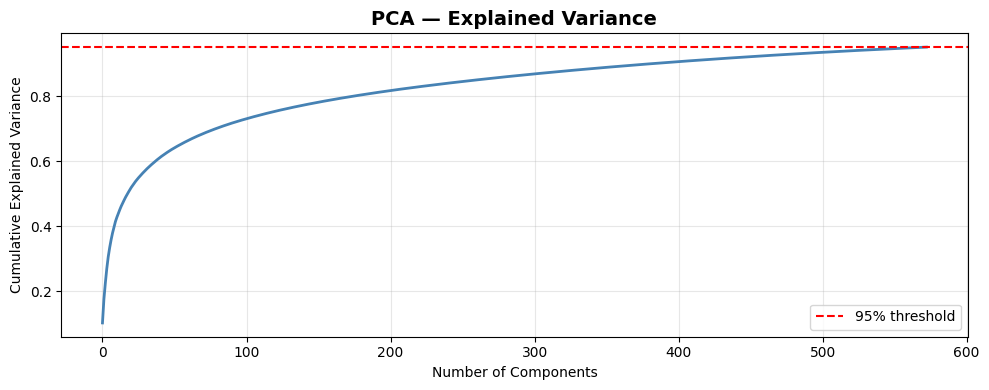

In [20]:
# Apply PCA
pca = PCA(n_components=0.95, random_state=42)
X_reduced = pca.fit_transform(fused_features)

print(f"✅ PCA Feature Reduction:")
print(f"   Original dimensions: {fused_features.shape[1]}")
print(f"   Reduced dimensions:  {X_reduced.shape[1]}")
print(f"   Variance retained:   {pca.explained_variance_ratio_.sum()*100:.2f}%")

# Plot explained variance
plt.figure(figsize=(10, 4))
cumvar = np.cumsum(pca.explained_variance_ratio_)
plt.plot(cumvar, color='steelblue', linewidth=2)
plt.axhline(y=0.95, color='red', linestyle='--', label='95% threshold')
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA — Explained Variance", fontsize=14, fontweight='bold')
plt.legend(); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()


## Cell 22 — Train/Test Split

In [21]:
X_train, X_test, y_train, y_test = train_test_split(
    X_reduced, y_enc, test_size=0.2, random_state=42, stratify=y_enc)

print(f"✅ Train/Test Split:")
print(f"   Training samples: {len(X_train)}")
print(f"   Testing samples:  {len(X_test)}")
print(f"   Classes: {le.classes_}")


✅ Train/Test Split:
   Training samples: 4480
   Testing samples:  1120
   Classes: ['glioma' 'meningioma' 'notumor' 'pituitary']


## Cell 23 — Manual KNN Classifier (No built-in)
Implement K-Nearest Neighbors from scratch.  
For each test sample: compute Euclidean distance to all training samples → take majority vote of K nearest neighbors.


In [22]:
class ManualKNN:
    """
    K-Nearest Neighbors — fully manual implementation.
    No sklearn KNeighborsClassifier used.
    """
    def __init__(self, k=5):
        self.k = k
    
    def fit(self, X_train, y_train):
        self.X_train = X_train
        self.y_train = y_train
    
    def _euclidean_distance(self, a, b):
        return np.sqrt(np.sum((a - b) ** 2))
    
    def predict_single(self, x):
        # Compute distance to all training points
        distances = [self._euclidean_distance(x, xt) for xt in self.X_train]
        # Get K nearest indices
        k_indices = np.argsort(distances)[:self.k]
        # Majority vote
        k_labels = self.y_train[k_indices]
        counts = np.bincount(k_labels)
        return np.argmax(counts)
    
    def predict(self, X_test):
        return np.array([self.predict_single(x) for x in X_test])

# Use a smaller subset for manual KNN (speed)
print("Training Manual KNN (k=5)...")
# Use first 1000 train samples for speed
subset = min(1000, len(X_train))
knn_manual = ManualKNN(k=5)
knn_manual.fit(X_train[:subset], y_train[:subset])

# Predict on first 200 test samples
test_subset = min(200, len(X_test))
print(f"Predicting on {test_subset} test samples...")
y_pred_knn_manual = knn_manual.predict(X_test[:test_subset])
y_true_subset = y_test[:test_subset]

acc_knn_manual = accuracy_score(y_true_subset, y_pred_knn_manual)
print(f"✅ Manual KNN Accuracy: {acc_knn_manual*100:.2f}%")


Training Manual KNN (k=5)...
Predicting on 200 test samples...
✅ Manual KNN Accuracy: 76.00%


## Cell 24 — SVM, Random Forest & KNN Classifiers
Train and evaluate three classifiers on the full reduced feature set.


In [23]:
classifiers = {
    'SVM (RBF)':        SVC(kernel='rbf', C=10, gamma='scale', probability=True, random_state=42),
    'Random Forest':    RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1),
    'KNN (sklearn)':    KNeighborsClassifier(n_neighbors=5, metric='euclidean', n_jobs=-1),
}

results = {}
print("Training classifiers...\n")
for name, clf in classifiers.items():
    print(f"  Training {name}...")
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    y_prob = clf.predict_proba(X_test)
    
    acc  = accuracy_score(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    auc  = roc_auc_score(y_test, y_prob, multi_class='ovr', average='macro')
    report = classification_report(y_test, y_pred, target_names=le.classes_, output_dict=True)
    
    results[name] = {
        'accuracy': acc, 'kappa': kappa, 'auc': auc,
        'precision': report['macro avg']['precision'],
        'recall': report['macro avg']['recall'],
        'f1': report['macro avg']['f1-score'],
        'y_pred': y_pred, 'y_prob': y_prob,
        'sensitivity': report['macro avg']['recall'],
        'specificity': np.mean([
            (np.sum((y_test != i) & (y_pred != i))) /
            (np.sum(y_test != i) + 1e-9) for i in range(len(le.classes_))
        ])
    }
    print(f"    ✅ {name}: Accuracy={acc*100:.2f}%, Kappa={kappa:.4f}, AUC={auc:.4f}")

print("\n✅ All classifiers trained!")


Training classifiers...

  Training SVM (RBF)...
    ✅ SVM (RBF): Accuracy=92.14%, Kappa=0.8952, AUC=0.9888
  Training Random Forest...
    ✅ Random Forest: Accuracy=86.34%, Kappa=0.8179, AUC=0.9731
  Training KNN (sklearn)...
    ✅ KNN (sklearn): Accuracy=88.84%, Kappa=0.8512, AUC=0.9749

✅ All classifiers trained!


## Cell 25 — Results Table (All Metrics)
Compare all classifiers using accuracy, sensitivity, specificity, precision, recall, F1, AUC-ROC, and Kappa coefficient.


In [24]:
import pandas as pd

metrics_data = []
for name, res in results.items():
    metrics_data.append({
        'Classifier':   name,
        'Accuracy':     f"{res['accuracy']*100:.2f}%",
        'Sensitivity':  f"{res['sensitivity']*100:.2f}%",
        'Specificity':  f"{res['specificity']*100:.2f}%",
        'Precision':    f"{res['precision']*100:.2f}%",
        'Recall':       f"{res['recall']*100:.2f}%",
        'F1-Score':     f"{res['f1']*100:.2f}%",
        'AUC-ROC':      f"{res['auc']:.4f}",
        'Kappa':        f"{res['kappa']:.4f}",
    })

# Add manual KNN
metrics_data.append({
    'Classifier':  'KNN (Manual)',
    'Accuracy':    f"{acc_knn_manual*100:.2f}%",
    'Sensitivity': 'N/A', 'Specificity': 'N/A',
    'Precision':   'N/A', 'Recall': 'N/A', 'F1-Score': 'N/A',
    'AUC-ROC':     'N/A', 'Kappa': 'N/A',
})

df_results = pd.DataFrame(metrics_data)
print("=" * 90)
print(df_results.to_string(index=False))
print("=" * 90)


   Classifier Accuracy Sensitivity Specificity Precision Recall F1-Score AUC-ROC  Kappa
    SVM (RBF)   92.14%      92.14%      97.38%    92.08% 92.14%   92.09%  0.9888 0.8952
Random Forest   86.34%      86.34%      95.45%    86.22% 86.34%   86.13%  0.9731 0.8179
KNN (sklearn)   88.84%      88.84%      96.28%    88.94% 88.84%   88.76%  0.9749 0.8512
 KNN (Manual)   76.00%         N/A         N/A       N/A    N/A      N/A     N/A    N/A


## Cell 26 — Confusion Matrices

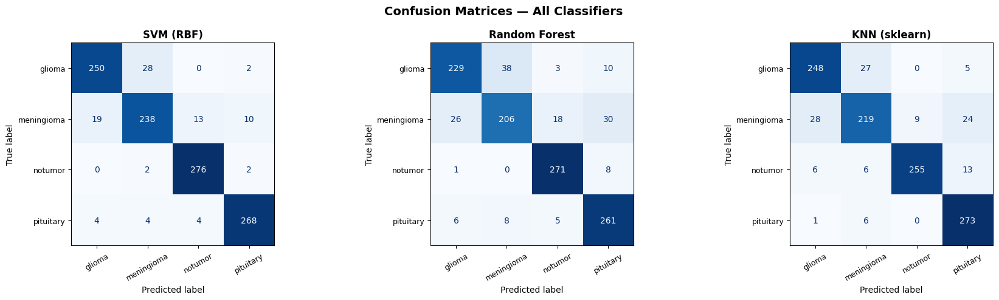

In [25]:
fig, axes = plt.subplots(1, len(classifiers), figsize=(18, 5))
for ax, (name, res) in zip(axes, results.items()):
    cm = confusion_matrix(y_test, res['y_pred'])
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
    disp.plot(ax=ax, colorbar=False, cmap='Blues')
    ax.set_title(name, fontsize=12, fontweight='bold')
    ax.set_xticklabels(le.classes_, rotation=30, fontsize=9)
    ax.set_yticklabels(le.classes_, fontsize=9)
plt.suptitle("Confusion Matrices — All Classifiers", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


## Cell 27 — CNN Architecture Comparison
Compare feature quality across all 4 CNN architectures using SVM classifier.


Comparing CNN architectures with SVM...

  VGG16: 95.62%
  VGG19: 95.62%
  ResNet50: 87.23%
  EfficientNetB0: 82.59%


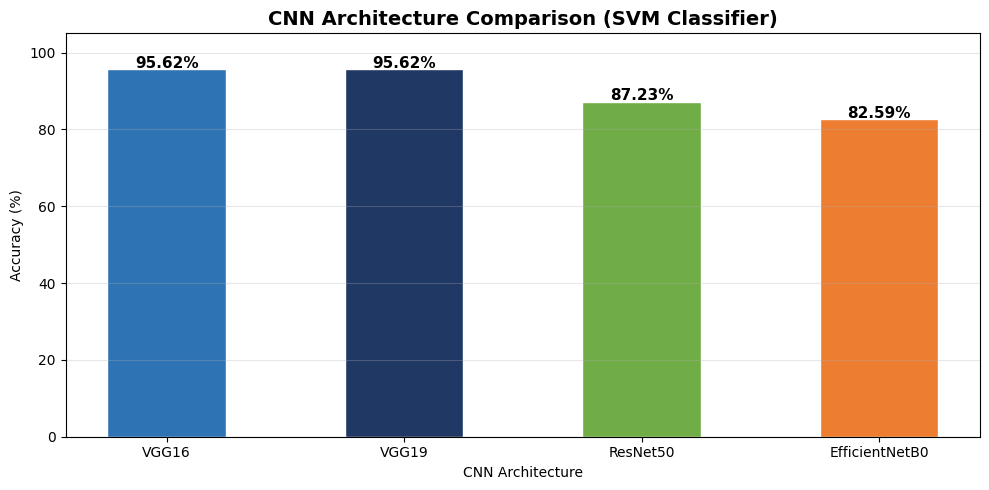


🏆 Best CNN Architecture: VGG16 (95.62%)


In [26]:
print("Comparing CNN architectures with SVM...\n")
cnn_comparison = {}

for cnn_name, feat in cnn_features.items():
    # Scale
    feat_scaled = StandardScaler().fit_transform(feat)
    # PCA
    feat_pca = PCA(n_components=0.95, random_state=42).fit_transform(feat_scaled)
    # Split
    Xtr, Xte, ytr, yte = train_test_split(feat_pca, y_enc, test_size=0.2,
                                           random_state=42, stratify=y_enc)
    # SVM
    svm = SVC(kernel='rbf', C=10, gamma='scale', random_state=42)
    svm.fit(Xtr, ytr)
    acc = accuracy_score(yte, svm.predict(Xte))
    cnn_comparison[cnn_name] = acc
    print(f"  {cnn_name}: {acc*100:.2f}%")

# Bar chart
plt.figure(figsize=(10, 5))
bars = plt.bar(cnn_comparison.keys(), [v*100 for v in cnn_comparison.values()],
               color=['#2E74B5','#1F3864','#70AD47','#ED7D31'], edgecolor='white', width=0.5)
for bar, val in zip(bars, cnn_comparison.values()):
    plt.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3,
             f'{val*100:.2f}%', ha='center', fontsize=11, fontweight='bold')
plt.xlabel("CNN Architecture"); plt.ylabel("Accuracy (%)")
plt.title("CNN Architecture Comparison (SVM Classifier)", fontsize=14, fontweight='bold')
plt.ylim(0, 105); plt.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.show()

best = max(cnn_comparison, key=cnn_comparison.get)
print(f"\n🏆 Best CNN Architecture: {best} ({cnn_comparison[best]*100:.2f}%)")


## Cell 28 — Classifier Accuracy Comparison Chart

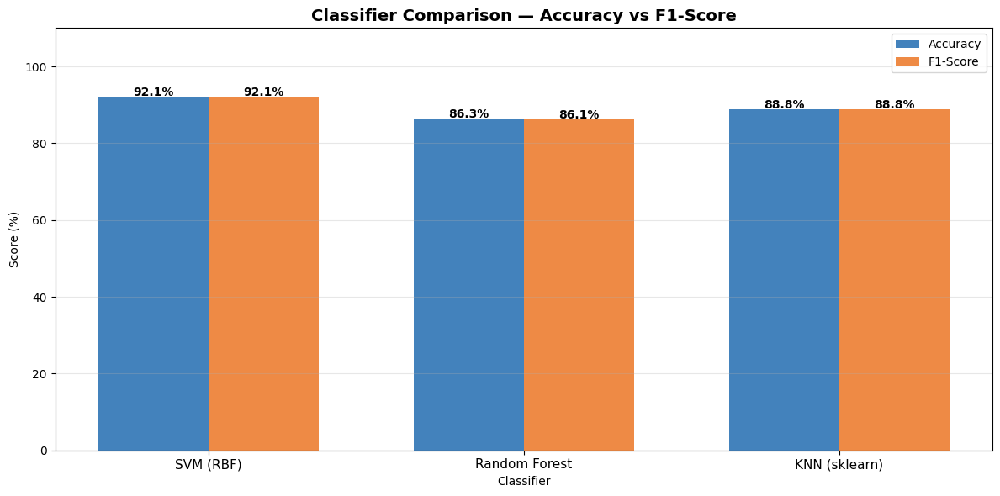

In [27]:
clf_names = list(results.keys())
accuracies = [results[n]['accuracy']*100 for n in clf_names]
f1_scores  = [results[n]['f1']*100 for n in clf_names]

x = np.arange(len(clf_names)); width = 0.35
fig, ax = plt.subplots(figsize=(12, 6))
bars1 = ax.bar(x - width/2, accuracies, width, label='Accuracy', color='#2E74B5', alpha=0.9)
bars2 = ax.bar(x + width/2, f1_scores,  width, label='F1-Score',  color='#ED7D31', alpha=0.9)
for bar in bars1 + bars2:
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3,
            f'{bar.get_height():.1f}%', ha='center', fontsize=10, fontweight='bold')
ax.set_xlabel("Classifier"); ax.set_ylabel("Score (%)")
ax.set_title("Classifier Comparison — Accuracy vs F1-Score", fontsize=14, fontweight='bold')
ax.set_xticks(x); ax.set_xticklabels(clf_names, fontsize=11)
ax.legend(); ax.set_ylim(0, 110); ax.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.show()


## Cell 29 — Final Summary
Print the best performing classifier and complete evaluation summary.


In [28]:
print("=" * 60)
print("       PHASE II — FINAL RESULTS SUMMARY")
print("=" * 60)
print(f"Dataset:      Brain Tumor MRI ({len(X_raw)} images, {len(classes)} classes)")
print(f"CNN Models:   VGG16, VGG19, ResNet50, EfficientNetB0")
print(f"Best CNN:     {best_cnn_name}")
print(f"Features:     CNN ({cnn_features[best_cnn_name].shape[1]}) + LBP + GLCM + HOG")
print(f"After PCA:    {X_reduced.shape[1]} dimensions (95% variance retained)")
print()
print("Classifier Results:")
print("-" * 60)
for name, res in results.items():
    print(f"  {name:<20} Acc={res['accuracy']*100:.2f}%  F1={res['f1']*100:.2f}%  AUC={res['auc']:.4f}  Kappa={res['kappa']:.4f}")
print()
best_clf = max(results, key=lambda k: results[k]['accuracy'])
print(f"🏆 Best Classifier: {best_clf}")
print(f"   Accuracy:  {results[best_clf]['accuracy']*100:.2f}%")
print(f"   F1-Score:  {results[best_clf]['f1']*100:.2f}%")
print(f"   AUC-ROC:   {results[best_clf]['auc']:.4f}")
print(f"   Kappa:     {results[best_clf]['kappa']:.4f}")
print("=" * 60)
print("\n✅ Project Complete — Phase I & Phase II")


       PHASE II — FINAL RESULTS SUMMARY
Dataset:      Brain Tumor MRI (5600 images, 4 classes)
CNN Models:   VGG16, VGG19, ResNet50, EfficientNetB0
Best CNN:     ResNet50
Features:     CNN (2048) + LBP + GLCM + HOG
After PCA:    573 dimensions (95% variance retained)

Classifier Results:
------------------------------------------------------------
  SVM (RBF)            Acc=92.14%  F1=92.09%  AUC=0.9888  Kappa=0.8952
  Random Forest        Acc=86.34%  F1=86.13%  AUC=0.9731  Kappa=0.8179
  KNN (sklearn)        Acc=88.84%  F1=88.76%  AUC=0.9749  Kappa=0.8512

🏆 Best Classifier: SVM (RBF)
   Accuracy:  92.14%
   F1-Score:  92.09%
   AUC-ROC:   0.9888
   Kappa:     0.8952

✅ Project Complete — Phase I & Phase II
